In [ ]:
!unzip -q MRI.zip -d dataset

In [ ]:
!ls dataset

brain_tumor_dataset  no  yes


In [ ]:
from PIL import Image
import numpy as np
import os
from tqdm import tqdm

def preprocess_images(folder_path, size=(128, 128)):
    images = []
    for img_name in tqdm(os.listdir(folder_path)):
        img_path = os.path.join(folder_path, img_name)
        img = Image.open(img_path).convert('L')  # Convert to grayscale
        img = img.resize(size, Image.ANTIALIAS)
        img_np = np.array(img, dtype=np.float32) / 255.0  # Normalize
        images.append(img_np.flatten())  # Flatten and store
    return np.array(images)

# Assuming 'yes' and 'no' folders are directly inside 'dataset'
yes_images = preprocess_images('dataset/yes')
no_images = preprocess_images('dataset/no')


  0%|          | 0/155 [00:00<?, ?it/s]<ipython-input-3-7f46d793dde8>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize(size, Image.ANTIALIAS)
100%|██████████| 98/98 [00:00<00:00, 394.56it/s]


In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import os
from PIL import Image
import torchvision.transforms as transforms
import torch

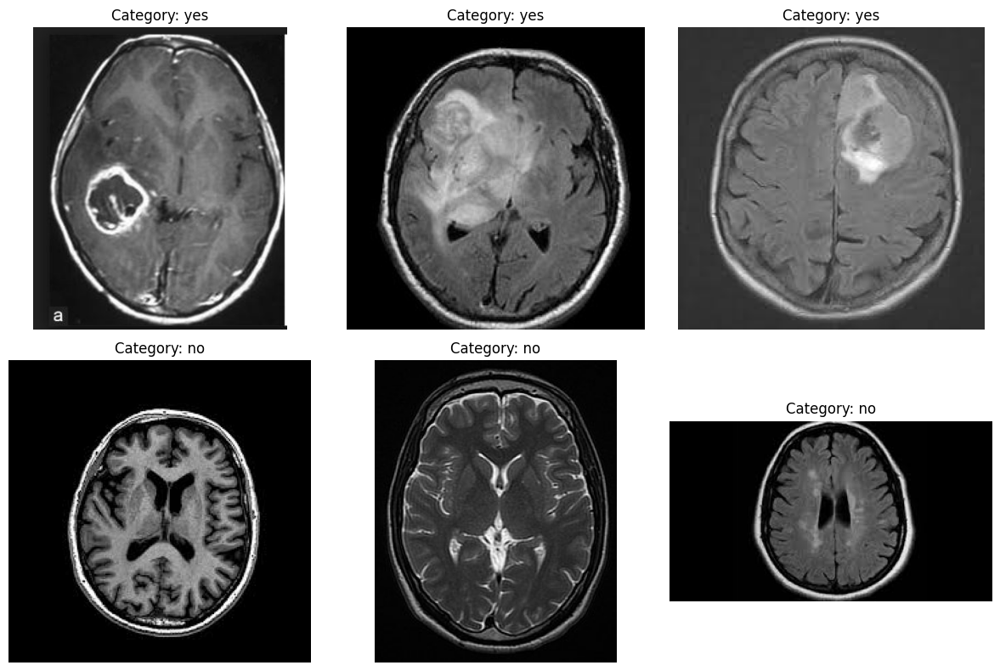

In [ ]:
def load_image_as_tensor(image_path):
    img = Image.open(image_path).convert('L')  # Convert to grayscale
    transform = transforms.ToTensor()
    tensor_img = transform(img)
    return tensor_img

def display_sample_images(base_dir, num_samples=3):
    """
    Load and display sample images as tensors from each category ('yes' and 'no').

    Parameters:
    - base_dir (str): Base directory containing 'yes' and 'no' subdirectories.
    - num_samples (int): Number of sample images to display from each category.
    """
    categories = ['yes', 'no']  # Subdirectories for each category
    fig, axs = plt.subplots(len(categories), num_samples, figsize=(num_samples * 4, len(categories) * 4))

    for i, category in enumerate(categories):
        category_dir = os.path.join(base_dir, category)
        sample_images = os.listdir(category_dir)[:num_samples]  # Get the first few images
        for j, image_name in enumerate(sample_images):
            image_path = os.path.join(category_dir, image_name)
            tensor_img = load_image_as_tensor(image_path)
            img = transforms.ToPILImage()(tensor_img).convert("RGB")  # Convert back to PIL image to display
            axs[i, j].imshow(img)
            axs[i, j].axis('off')
            axs[i, j].set_title(f"Category: {category}")

    plt.tight_layout()
    plt.show()

# Adjust the path according to your dataset structure
base_dir = 'dataset/brain_tumor_dataset'  # Update to the correct path
display_sample_images(base_dir, num_samples=3)

In [ ]:
#include <iostream>
#include <cmath>
#include <float.h>
#include <cuda_runtime.h>

__global__ void assignClusters(float *data, float *centroids, int *assignments, int numPoints, int numCentroids, int dimensions) {
    int idx = blockDim.x * blockIdx.x + threadIdx.x;
    if (idx < numPoints) {
        float minDist = FLT_MAX;
        int minIdx = 0;
        for (int c = 0; c < numCentroids; ++c) {
            float dist = 0.0;
            for (int d = 0; d < dimensions; ++d) {
                float diff = data[idx * dimensions + d] - centroids[c * dimensions + d];
                dist += diff * diff;
            }
            if (dist < minDist) {
                minDist = dist;
                minIdx = c;
            }
        }
        assignments[idx] = minIdx;
    }
}

__global__ void updateCentroids(float *data, float *centroids, int *assignments, int *counts, int numPoints, int numCentroids, int dimensions) {
    extern __shared__ float sharedData[];
    int idx = blockDim.x * blockIdx.x + threadIdx.x;

    if (idx < numCentroids) {
        for (int d = 0; d < dimensions; ++d) {
            sharedData[idx * dimensions + d] = 0;
        }
        counts[idx] = 0;
    }
    __syncthreads();

    if (idx < numPoints) {
        int clusterId = assignments[idx];
        atomicAdd(&counts[clusterId], 1);
        for (int d = 0; d < dimensions; ++d) {
            atomicAdd(&sharedData[clusterId * dimensions + d], data[idx * dimensions + d]);
        }
    }
    __syncthreads();

    if (idx < numCentroids) {
        for (int d = 0; d < dimensions; ++d) {
            centroids[idx * dimensions + d] = sharedData[idx * dimensions + d] / counts[idx];
        }
    }
}

// Host function to call kernels
void kmeans(float *h_data, int numPoints, int dimensions, int numCentroids, int maxIterations) {
    float *d_data, *d_centroids;
    int *d_assignments, *d_counts;
    // Allocate device memory and copy data from host to device

    // Initialize centroids (possibly on the host and copy to device)

    for (int i = 0; i < maxIterations; ++i) {
        assignClusters<<<(numPoints + 255) / 256, 256>>>(d_data, d_centroids, d_assignments, numPoints, numCentroids, dimensions);
        cudaDeviceSynchronize();
        updateCentroids<<<(numCentroids + 255) / 256, 256, numCentroids * dimensions * sizeof(float)>>>(d_data, d_centroids, d_assignments, d_counts, numPoints, numCentroids, dimensions);
        cudaDeviceSynchronize();

        // Check for convergence (not shown)
    }

    // Copy results back to host
    // Free device memory
}

int main() {
    // Prepare data and call kmeans()
    return 0;
}


SyntaxError: invalid syntax (<ipython-input-8-df95b4d34fcb>, line 6)

In [ ]:
%%writefile kmeans.cu

Overwriting kmeans.cu


In [ ]:
!pwd

/content


In [ ]:
!ls

cuda_programs  dataset	kmeans.cu  MRI.zip  sample_data


In [ ]:
!nvcc -o kmeans kmeans.cu
!./kmeans

/usr/bin/ld: /usr/lib/gcc/x86_64-linux-gnu/11/../../../x86_64-linux-gnu/Scrt1.o: in function `_start':
(.text+0x1b): undefined reference to `main'
collect2: error: ld returned 1 exit status
/bin/bash: line 1: ./kmeans: No such file or directory


In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


In [ ]:
from google.colab import files
files.download('kmeans.cu')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

TRY

In [ ]:
!pip install pycuda

In [ ]:
import pycuda.autoinit
import pycuda.driver as cuda
from pycuda.compiler import SourceModule
import numpy as np
from PIL import Image
from tqdm import tqdm
import os

In [ ]:
def preprocess_images(folder_path, size=(128, 128)):
    images = []
    for img_name in tqdm(os.listdir(folder_path)):
        img_path = os.path.join(folder_path, img_name)
        img = Image.open(img_path).convert('L')
        img = img.resize(size, Image.ANTIALIAS)
        img_np = np.array(img, dtype=np.float32) / 255.0
        images.append(img_np.flatten())
    return np.array(images)

In [ ]:
# Load and preprocess images
yes_images = preprocess_images('dataset/yes')
no_images = preprocess_images('dataset/no')
data = np.concatenate((yes_images, no_images), axis=0)

  0%|          | 0/155 [00:00<?, ?it/s]<ipython-input-10-ea1cbe402806>:6: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize(size, Image.ANTIALIAS)
100%|██████████| 98/98 [00:00<00:00, 192.20it/s]


In [ ]:
# Assuming the number of centroids (clusters) is k
k = 2
num_features = yes_images.shape[1]
num_points = data.shape[0]

# Randomly initialize centroids
centroids = data[np.random.choice(range(num_points), size=k, replace=False)]

In [ ]:
# CUDA kernel for K-means clustering
cuda_kernels = __global__ void assignClusters(const float *data, const float *centroids, int *assignments, int num_points, int num_features, int k) {
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    if (idx >= num_points) return;

    float min_dist = INFINITY;
    int closest_centroid = 0;
    for (int c = 0; c < k; ++c) {
        float dist = 0;
        for (int d = 0; d < num_features; ++d) {
            float diff = data[idx * num_features + d] - centroids[c * num_features + d];
            dist += diff * diff;
        }
        if (dist < min_dist) {
            min_dist = dist;
            closest_centroid = c;
        }
    }
    assignments[idx] = closest_centroid;
}

__global__ void updateCentroids(const float *data, float *centroids, const int *assignments, int num_points, int num_features, int k) {
    int c = blockIdx.x * blockDim.x + threadIdx.x;
    if (c >= k) return;

    float new_centroid[num_features] = {0};
    int points_in_cluster = 0;
    for (int idx = 0; idx < num_points; ++idx) {
        if (assignments[idx] == c) {
            for (int d = 0; d < num_features; ++d) {
                new_centroid[d] += data[idx * num_features + d];
            }
            points_in_cluster++;
        }
    }

    if (points_in_cluster > 0) {
        for (int d = 0; d < num_features; ++d) {
            centroids[c * num_features + d] = new_centroid[d] / points_in_cluster;
        }
    }
}







mod = SourceModule(cuda_kernels)
assignClusters = mod.get_function("assignClusters")
updateCentroids = mod.get_function("updateCentroids")

# Allocate memory on GPU and transfer data
data_gpu = cuda.mem_alloc(data.nbytes)
cuda.memcpy_htod(data_gpu, data)

centroids_gpu = cuda.mem_alloc(centroids.nbytes)
cuda.memcpy_htod(centroids_gpu, centroids)

assignments = np.empty(num_points, dtype=np.int32)
assignments_gpu = cuda.mem_alloc(assignments.nbytes)

# Set up block and grid dimensions
block_size = 256
grid_size = (num_points + block_size - 1) // block_size

# Iterate the K-means clustering process
for iteration in range(10):  # Limit to 10 iterations for this example
    assignClusters(data_gpu, centroids_gpu, assignments_gpu, np.int32(num_points), np.int32(num_features), np.int32(k),
                   block=(block_size, 1, 1), grid=(grid_size, 1))
    cuda.memcpy_dtoh(assignments, assignments_gpu)  # Optionally check convergence based on assignments

    updateCentroids(data_gpu, centroids_gpu, assignments_gpu, np.int32(num_points), np.int32(num_features), np.int32(k),
                    block=(block_size, 1, 1), grid=(grid_size, 1))
    cuda.memcpy_dtoh(centroids, centroids_gpu)  # Update centroids on host if needed

# After clustering, you may want to transfer back the final centroids and assignments to the host for further analysis
print("Clustering completed.")


"""This script is conceptual and needs the actual CUDA kernel code for assignClusters and updateCentroids to be filled in based on the previous examples or your specific implementation details. It demonstrates how to integrate preprocessing, data preparation, and CUDA-based processing in a unified workflow.

This approach leverages PyCUDA for GPU memory management and kernel execution, seamlessly connecting the data preparation phase in Python with the high-performance computation capabilities of CUDA for K-means clustering. Before running, ensure the kernel implementations are complete and correctly handle the data structures used in this workflow.


User"""





SyntaxError: invalid syntax (<ipython-input-13-d16173d9c9ce>, line 2)

In [ ]:
import pycuda.autoinit
import pycuda.driver as cuda
from pycuda.compiler import SourceModule
import numpy as np

cuda_kernels = """
__global__ void assignClusters(const float *data, const float *centroids, int *assignments, int num_points, int num_features, int k) {
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    if (idx >= num_points) return;

    float min_dist = INFINITY;
    int closest_centroid = 0;
    for (int c = 0; c < k; ++c) {
        float dist = 0;
        for (int d = 0; d < num_features; ++d) {
            float diff = data[idx * num_features + d] - centroids[c * num_features + d];
            dist += diff * diff;
        }
        if (dist < min_dist) {
            min_dist = dist;
            closest_centroid = c;
        }
    }
    assignments[idx] = closest_centroid;
}

__global__ void updateCentroids(const float *data, float *centroids, const int *assignments, int num_points, int num_features, int k) {
    int c = blockIdx.x * blockDim.x + threadIdx.x;
    if (c >= k) return;

    float new_centroid[num_features] = {0};
    int points_in_cluster = 0;
    for (int idx = 0; idx < num_points; ++idx) {
        if (assignments[idx] == c) {
            for (int d = 0; d < num_features; ++d) {
                new_centroid[d] += data[idx * num_features + d];
            }
            points_in_cluster++;
        }
    }

    if (points_in_cluster > 0) {
        for (int d = 0; d < num_features; ++d) {
            centroids[c * num_features + d] = new_centroid[d] / points_in_cluster;
        }
    }
}
"""

# Assuming `data` and `centroids` are already defined numpy arrays
# num_points, num_features, and k should also be defined

mod = SourceModule(cuda_kernels)
assignClusters = mod.get_function("assignClusters")
updateCentroids = mod.get_function("updateCentroids")

# Allocate memory on GPU and transfer data
data_gpu = cuda.mem_alloc(data.nbytes)
cuda.memcpy_htod(data_gpu, data)

centroids_gpu = cuda.mem_alloc(centroids.nbytes)
cuda.memcpy_htod(centroids_gpu, centroids)

assignments = np.empty(num_points, dtype=np.int32)
assignments_gpu = cuda.mem_alloc(assignments.nbytes)

# Set up block and grid dimensions
block_size = 256
grid_size_assign = (num_points + block_size - 1) // block_size
grid_size_update = (k + block_size - 1) // block_size

# Iterate the K-means clustering process
for iteration in range(10):  # Limit to 10 iterations for this example
    assignClusters(data_gpu, centroids_gpu, assignments_gpu, np.int32(num_points), np.int32(num_features), np.int32(k),
                   block=(block_size, 1, 1), grid=(grid_size_assign, 1))
    cuda.memcpy_dtoh(assignments, assignments_gpu)  # Optionally check convergence based on assignments

    updateCentroids(data_gpu, centroids_gpu, assignments_gpu, np.int32(num_points), np.int32(num_features), np.int32(k),
                    block=(block_size, 1, 1), grid=(grid_size_update, 1))
    cuda.memcpy_dtoh(centroids, centroids_gpu)  # Update centroids on host if needed

# After clustering, you may want to transfer back the final centroids and assignments to the host for further analysis
print("Clustering completed.")


In [ ]:
import pycuda.autoinit
import pycuda.driver as cuda
from pycuda.compiler import SourceModule
import numpy as np

MAX_NUM_FEATURES = 128  # Define an upper bound for the number of features

cuda_kernels = f"""
#define MAX_NUM_FEATURES {MAX_NUM_FEATURES}

__global__ void assignClusters(const float *data, const float *centroids, int *assignments, int num_points, int num_features, int k) {{
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    if (idx >= num_points) return;

    float min_dist = INFINITY;
    int closest_centroid = 0;
    for (int c = 0; c < k; ++c) {{
        float dist = 0;
        for (int d = 0; d < num_features; ++d) {{
            float diff = data[idx * num_features + d] - centroids[c * num_features + d];
            dist += diff * diff;
        }}
        if (dist < min_dist) {{
            min_dist = dist;
            closest_centroid = c;
        }}
    }}
    assignments[idx] = closest_centroid;
}}

__global__ void updateCentroids(const float *data, float *centroids, const int *assignments, int num_points, int num_features, int k) {{
    int c = blockIdx.x * blockDim.x + threadIdx.x;
    if (c >= k) return;

    float new_centroid[MAX_NUM_FEATURES] = {{0}};
    int points_in_cluster = 0;
    for (int idx = 0; idx < num_points; ++idx) {{
        if (assignments[idx] == c) {{
            for (int d = 0; d < num_features; ++d) {{
                new_centroid[d] += data[idx * num_features + d];
            }}
            points_in_cluster++;
        }}
    }}

    if (points_in_cluster > 0) {{
        for (int d = 0; d < num_features; ++d) {{
            centroids[c * num_features + d] = new_centroid[d] / points_in_cluster;
        }}
    }}
}}
"""

# Assuming `data` and `centroids` are already defined numpy arrays
# num_points, num_features, and k should also be defined

mod = SourceModule(cuda_kernels)
assignClusters = mod.get_function("assignClusters")
updateCentroids = mod.get_function("updateCentroids")

# Allocate memory on GPU and transfer data
data_gpu = cuda.mem_alloc(data.nbytes)
cuda.memcpy_htod(data_gpu, data)

centroids_gpu = cuda.mem_alloc(centroids.nbytes)
cuda.memcpy_htod(centroids_gpu, centroids)

assignments = np.empty(num_points, dtype=np.int32)
assignments_gpu = cuda.mem_alloc(assignments.nbytes)

# Set up block and grid dimensions
block_size = 256
grid_size_assign = (num_points + block_size - 1) // block_size
grid_size_update = (k + block_size - 1) // block_size

# Iterate the K-means clustering process
for iteration in range(10):  # Limit to 10 iterations for this example
    assignClusters(data_gpu, centroids_gpu, assignments_gpu, np.int32(num_points), np.int32(num_features), np.int32(k),
                   block=(block_size, 1, 1), grid=(grid_size_assign, 1))
    cuda.memcpy_dtoh(assignments, assignments_gpu)  # Optionally check convergence based on assignments

    updateCentroids(data_gpu, centroids_gpu, assignments_gpu, np.int32(num_points), np.int32(num_features), np.int32(k),
                    block=(block_size, 1, 1), grid=(grid_size_update, 1))
    cuda.memcpy_dtoh(centroids, centroids_gpu)  # Update centroids on host if needed

# After clustering, you may want to transfer back the final centroids and assignments to the host for further analysis
print("Clustering completed.")


In [ ]:
import pycuda.autoinit
import pycuda.driver as cuda
from pycuda.compiler import SourceModule
import numpy as np

MAX_NUM_FEATURES = 128  # Ensure this covers your maximum features

cuda_kernels = f"""
#define MAX_NUM_FEATURES {MAX_NUM_FEATURES}

// Assign clusters to each point based on the nearest centroid
__global__ void assignClusters(const float *data, const float *centroids, int *assignments, int num_points, int num_features, int k) {{
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    if (idx >= num_points) return;  // Ensure we do not exceed the number of points

    float min_dist = INFINITY;
    int closest_centroid = 0;
    for (int c = 0; c < k; ++c) {{
        float dist = 0;
        for (int d = 0; d < num_features; ++d) {{
            float diff = data[idx * num_features + d] - centroids[c * num_features + d];
            dist += diff * diff;
        }}
        if (dist < min_dist) {{
            min_dist = dist;
            closest_centroid = c;
        }}
    }}
    assignments[idx] = closest_centroid;  // Assign the closest centroid
}}

// Update centroids based on assigned clusters
__global__ void updateCentroids(const float *data, float *centroids, const int *assignments, int num_points, int num_features, int k) {{
    extern __shared__ float shared_data[];  // Use shared memory for reduction
    int c = blockIdx.x * blockDim.x + threadIdx.x;
    if (c >= k) return;  // Ensure we do not exceed the number of centroids

    float new_centroid[MAX_NUM_FEATURES] = {{0}};
    int points_in_cluster = 0;
    for (int idx = 0; idx < num_points; ++idx) {{
        if (assignments[idx] == c) {{
            for (int d = 0; d < num_features; ++d) {{
                new_centroid[d] += data[idx * num_features + d];
            }}
            points_in_cluster++;
        }}
    }}

    if (points_in_cluster > 0) {{
        for (int d = 0; d < num_features; ++d) {{
            centroids[c * num_features + d] = new_centroid[d] / points_in_cluster;  // Update centroid
        }}
    }}
}}
"""

# Replace with your data preparation code
# Ensure data, centroids, num_points, num_features, and k are correctly defined

mod = SourceModule(cuda_kernels)
assignClusters = mod.get_function("assignClusters")
updateCentroids = mod.get_function("updateCentroids")

# Allocate memory on GPU and transfer data
data_gpu = cuda.mem_alloc(data.nbytes)
cuda.memcpy_htod(data_gpu, data)

centroids_gpu = cuda.mem_alloc(centroids.nbytes)
cuda.memcpy_htod(centroids_gpu, centroids)

assignments = np.empty(num_points, dtype=np.int32)
assignments_gpu = cuda.mem_alloc(assignments.nbytes)

# Calculate grid and block sizes
block_size = 256
grid_size_assign = (num_points + block_size - 1) // block_size
grid_size_update = (k + block_size - 1) // block_size

# Perform the K-means iterations
for iteration in range(10):  # Example: 10 iterations
    assignClusters(data_gpu, centroids_gpu, assignments_gpu, np.int32(num_points), np.int32(num_features), np.int32(k),
                   block=(block_size, 1, 1), grid=(grid_size_assign, 1))
    # Synchronize after kernel execution to ensure all operations are complete
    pycuda.autoinit.context.synchronize()

    updateCentroids(data_gpu, centroids_gpu, assignments_gpu, np.int32(num_points), np.int32(num_features), np.int32(k),
                    block=(block_size, 1, 1), grid=(grid_size_update, 1), shared=(MAX_NUM_FEATURES * sizeof(float)))
    # Synchronize again after updating centroids
    pycuda.autoinit.context.synchronize()

    # Copy back the updated centroids to host memory
    cuda.memcpy_dtoh(centroids, centroids_gpu)

print("Clustering completed.")


LogicError: cuModuleLoadDataEx failed: an illegal memory access was encountered - 

In [ ]:
!nvidia-smi

Sun Apr 14 12:15:44 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   77C    P0              34W /  70W |    121MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import pycuda.autoinit
import pycuda.driver as cuda
from pycuda.compiler import SourceModule
import numpy as np

# Example setup for demonstration. Replace with your actual setup.
num_points = 1024
num_features = 64
k = 5
data = np.random.rand(num_points, num_features).astype(np.float32)
centroids = np.random.rand(k, num_features).astype(np.float32)

# Defining CUDA kernels
cuda_kernels = """
__global__ void assignClusters(const float *data, const float *centroids, int *assignments, int num_points, int num_features, int k) {
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    if (idx >= num_points) return;

    float min_dist = INFINITY;
    int closest_centroid = 0;
    for (int c = 0; c < k; ++c) {
        float dist = 0;
        for (int d = 0; d < num_features; ++d) {
            float diff = data[idx * num_features + d] - centroids[c * num_features + d];
            dist += diff * diff;
        }
        if (dist < min_dist) {
            min_dist = dist;
            closest_centroid = c;
        }
    }
    assignments[idx] = closest_centroid;
}

__global__ void updateCentroids(const float *data, float *centroids, const int *assignments, int num_points, int num_features, int k) {
    int c = blockIdx.x * blockDim.x + threadIdx.x;
    if (c >= k) return;

    float new_centroid[64] = {0}; // Assuming a fixed maximum size for simplicity
    int points_in_cluster = 0;
    for (int idx = 0; idx < num_points; ++idx) {
        if (assignments[idx] == c) {
            for (int d = 0; d < num_features; ++d) {
                new_centroid[d] += data[idx * num_features + d];
            }
            points_in_cluster++;
        }
    }

    if (points_in_cluster > 0) {
        for (int d = 0; d < num_features; ++d) {
            centroids[c * num_features + d] = new_centroid[d] / points_in_cluster;
        }
    }
}
"""

mod = SourceModule(cuda_kernels, options=["-arch=sm_75"])
#mod = SourceModule(cuda_kernels, options=["-arch=sm_35"])
#mod = SourceModule(cuda_kernels)
assignClusters = mod.get_function("assignClusters")
updateCentroids = mod.get_function("updateCentroids")

# Allocate memory on GPU and transfer data
data_gpu = cuda.mem_alloc(data.nbytes)
cuda.memcpy_htod(data_gpu, data)

centroids_gpu = cuda.mem_alloc(centroids.nbytes)
cuda.memcpy_htod(centroids_gpu, centroids)

assignments = np.empty(num_points, dtype=np.int32)
assignments_gpu = cuda.mem_alloc(assignments.nbytes)

# Set up block and grid dimensions
block_size = 256
grid_size_assign = (num_points + block_size - 1) // block_size
grid_size_update = (k + block_size - 1) // block_size

# Perform the K-means iterations
for iteration in range(10):  # Limiting to 10 iterations for demonstration
    assignClusters(data_gpu, centroids_gpu, assignments_gpu, np.int32(num_points), np.int32(num_features), np.int32(k),
                   block=(block_size, 1, 1), grid=(grid_size_assign, 1))
    cuda.memcpy_dtoh(assignments, assignments_gpu)  # Copying assignments back to host, optional here

    updateCentroids(data_gpu, centroids_gpu, assignments_gpu, np.int32(num_points), np.int32(num_features), np.int32(k),
                    block=(block_size, 1, 1), grid=(grid_size_update, 1))
    cuda.memcpy_dtoh(centroids, centroids_gpu)  # Updating centroids on host

print("Clustering completed.")

LogicError: cuModuleLoadDataEx failed: an illegal memory access was encountered - 

In [ ]:
import pycuda.autoinit
import pycuda.driver as cuda
from pycuda.compiler import SourceModule
import numpy as np

n = 1024  # Example size
data = np.zeros(n, dtype=np.float32)  # Initialize data

mod = SourceModule("""
__global__ void testKernel(float *data) {
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    data[idx] = 1.0f;
}
""", options=["-arch=sm_75"])

testKernel = mod.get_function("testKernel")

data_gpu = cuda.mem_alloc(data.nbytes)
cuda.memcpy_htod(data_gpu, data)

testKernel(data_gpu, block=(256, 1, 1), grid=(n // 256, 1))

cuda.memcpy_dtoh(data, data_gpu)
print(data)  # Should print an array of ones if successful


LogicError: cuModuleLoadDataEx failed: an illegal memory access was encountered - 

In [ ]:
import pycuda.autoinit
import pycuda.driver as cuda
from pycuda.compiler import SourceModule
import numpy as np

# Define the number of elements in the array
n = 1024
data = np.zeros(n, dtype=np.float32)  # Initialize data with zeros

# Define the CUDA kernel
kernel_code = """
__global__ void testKernel(float *data) {
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    data[idx] = 1.0f; // Simple operation
}
"""

# Compile the kernel code
mod = SourceModule(kernel_code)

# Get the kernel function from the compiled module
testKernel = mod.get_function("testKernel")

# Allocate memory on the device and copy the data
data_gpu = cuda.mem_alloc(data.nbytes)
cuda.memcpy_htod(data_gpu, data)

# Set up the block and grid sizes
block_size = 256
grid_size = (n + block_size - 1) // block_size

# Launch the kernel
testKernel(data_gpu, block=(block_size, 1, 1), grid=(grid_size, 1))

# Copy the modified array back to the host
cuda.memcpy_dtoh(data, data_gpu)

# Print the data to verify every element is set to 1.0f
print(data)


LogicError: cuModuleLoadDataEx failed: an illegal memory access was encountered - 

In [ ]:
!pip install --upgrade pycuda

In [ ]:
# CUDA kernel for K-means clustering
cuda_kernels = __global__ void assignClusters(const float *data, const float *centroids, int *assignments, int num_points, int num_features, int k) {
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    if (idx >= num_points) return;

    float min_dist = INFINITY;
    int closest_centroid = 0;
    for (int c = 0; c < k; ++c) {
        float dist = 0;
        for (int d = 0; d < num_features; ++d) {
            float diff = data[idx * num_features + d] - centroids[c * num_features + d];
            dist += diff * diff;
        }
        if (dist < min_dist) {
            min_dist = dist;
            closest_centroid = c;
        }
    }
    assignments[idx] = closest_centroid;
}

__global__ void updateCentroids(const float *data, float *centroids, const int *assignments, int num_points, int num_features, int k) {
    int c = blockIdx.x * blockDim.x + threadIdx.x;
    if (c >= k) return;

    float new_centroid[num_features] = {0};
    int points_in_cluster = 0;
    for (int idx = 0; idx < num_points; ++idx) {
        if (assignments[idx] == c) {
            for (int d = 0; d < num_features; ++d) {
                new_centroid[d] += data[idx * num_features + d];
            }
            points_in_cluster++;
        }
    }

    if (points_in_cluster > 0) {
        for (int d = 0; d < num_features; ++d) {
            centroids[c * num_features + d] = new_centroid[d] / points_in_cluster;
        }
    }
}

In [ ]:

CUDA Kernels for K-means Clustering
cuda
Copy code
__global__ void assignClusters(const float *data, const float *centroids, int *assignments, int num_points, int num_features, int k) {
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    if (idx >= num_points) return;

    float min_dist = INFINITY;
    int closest_centroid = 0;
    for (int c = 0; c < k; ++c) {
        float dist = 0;
        for (int d = 0; d < num_features; ++d) {
            float diff = data[idx * num_features + d] - centroids[c * num_features + d];
            dist += diff * diff;
        }
        if (dist < min_dist) {
            min_dist = dist;
            closest_centroid = c;
        }
    }
    assignments[idx] = closest_centroid;
}

__global__ void updateCentroids(const float *data, float *centroids, const int *assignments, int num_points, int num_features, int k) {
    int c = blockIdx.x * blockDim.x + threadIdx.x;
    if (c >= k) return;

    float new_centroid[num_features] = {0};
    int points_in_cluster = 0;
    for (int idx = 0; idx < num_points; ++idx) {
        if (assignments[idx] == c) {
            for (int d = 0; d < num_features; ++d) {
                new_centroid[d] += data[idx * num_features + d];
            }
            points_in_cluster++;
        }
    }

    if (points_in_cluster > 0) {
        for (int d = 0; d < num_features; ++d) {
            centroids[c * num_features + d] = new_centroid[d] / points_in_cluster;
        }
    }
}

In [ ]:
%%writefile kmeans.cu
extern "C" {
#include <math.h>

__global__ void assignClusters(const float *data, const float *centroids, int *assignments, int num_points, int num_features, int k) {
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    if (idx >= num_points) return;

    float min_dist = INFINITY;
    int closest_centroid = 0;
    for (int c = 0; c < k; ++c) {
        float dist = 0;
        for (int d = 0; d < num_features; ++d) {
            float diff = data[idx * num_features + d] - centroids[c * num_features + d];
            dist += diff * diff;
        }
        if (dist < min_dist) {
            min_dist = dist;
            closest_centroid = c;
        }
    }
    assignments[idx] = closest_centroid;
}

__global__ void updateCentroids(const float *data, float *centroids, const int *assignments, int num_points, int num_features, int k) {
    int c = blockIdx.x * blockDim.x + threadIdx.x;
    if (c >= k) return;

    float new_centroid[64] = {0}; // Assuming a fixed maximum size for simplicity
    int points_in_cluster = 0;
    for (int idx = 0; idx < num_points; ++idx) {
        if (assignments[idx] == c) {
            for (int d = 0; d < num_features; ++d) {
                new_centroid[d] += data[idx * num_features + d];
            }
            points_in_cluster++;
        }
    }

    if (points_in_cluster > 0) {
        for (int d = 0; d < num_features; ++d) {
            centroids[c * num_features + d] = new_centroid[d] / points_in_cluster;
        }
    }
}
}


Writing kmeans.cu


In [ ]:
!ls


dataset  kmeans.cu  MRI.zip  sample_data


In [ ]:
!nvcc -arch=sm_75 -o kmeans kmeans.cu

/usr/bin/ld: /usr/lib/gcc/x86_64-linux-gnu/11/../../../x86_64-linux-gnu/Scrt1.o: in function `_start':
(.text+0x1b): undefined reference to `main'
collect2: error: ld returned 1 exit status


In [ ]:
%%writefile K_Means.cu
extern "C" {
#include <math.h>

__global__ void assignClusters(const float *data, const float *centroids, int *assignments, int num_points, int num_features, int k) {
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    if (idx >= num_points) return;

    float min_dist = INFINITY;
    int closest_centroid = 0;
    for (int c = 0; c < k; ++c) {
        float dist = 0;
        for (int d = 0; d < num_features; ++d) {
            float diff = data[idx * num_features + d] - centroids[c * num_features + d];
            dist += diff * diff;
        }
        if (dist < min_dist) {
            min_dist = dist;
            closest_centroid = c;
        }
    }
    assignments[idx] = closest_centroid;
}

__global__ void updateCentroids(const float *data, float *centroids, const int *assignments, int num_points, int num_features, int k) {
    int c = blockIdx.x * blockDim.x + threadIdx.x;
    if (c >= k) return;

    float new_centroid[64] = {0}; // Assuming a fixed maximum size for simplicity
    int points_in_cluster = 0;
    for (int idx = 0; idx < num_points; ++idx) {
        if (assignments[idx] == c) {
            for (int d = 0; d < num_features; ++d) {
                new_centroid[d] += data[idx * num_features + d];
            }
            points_in_cluster++;
        }
    }

    if (points_in_cluster > 0) {
        for (int d = 0; d < num_features; ++d) {
            centroids[c * num_features + d] = new_centroid[d] / points_in_cluster;
        }
    }
}
}


Writing K_Means.cu


In [ ]:
ls

dataset/  kmeans.cu  K_Means.cu  MRI.zip  sample_data/


In [ ]:
!nvcc -arch=sm_75 -o K_Means K_Means.cu

/usr/bin/ld: /usr/lib/gcc/x86_64-linux-gnu/11/../../../x86_64-linux-gnu/Scrt1.o: in function `_start':
(.text+0x1b): undefined reference to `main'
collect2: error: ld returned 1 exit status


In [ ]:
%%writefile Test.cu

#include <iostream>
#include <cmath>
#include <cuda_runtime.h>

__global__ void assignClusters(const float *data, const float *centroids, int *assignments, int num_points, int num_features, int k) {
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    if (idx >= num_points) return;

    float min_dist = INFINITY;
    int closest_centroid = 0;
    for (int c = 0; c < k; ++c) {
        float dist = 0.0;
        for (int d = 0; d < num_features; ++d) {
            float diff = data[idx * num_features + d] - centroids[c * num_features + d];
            dist += diff * diff;
        }
        if (dist < min_dist) {
            min_dist = dist;
            closest_centroid = c;
        }
    }
    assignments[idx] = closest_centroid;
}

__global__ void updateCentroids(const float *data, float *centroids, const int *assignments, int num_points, int num_features, int k) {
    int c = blockIdx.x * blockDim.x + threadIdx.x;
    if (c >= k) return;

    float new_centroid[64] = {0}; // Assuming a fixed maximum size for simplicity
    int points_in_cluster = 0;
    for (int idx = 0; idx < num_points; ++idx) {
        if (assignments[idx] == c) {
            for (int d = 0; d < num_features; ++d) {
                new_centroid[d] += data[idx * num_features + d];
            }
            points_in_cluster++;
        }
    }

    if (points_in_cluster > 0) {
        for (int d = 0; d < num_features; ++d) {
            centroids[c * num_features + d] = new_centroid[d] / points_in_cluster;
        }
    }
}

#include <iostream>
#include <cmath>
#include <cuda_runtime.h>

// Kernel definitions as before...

int main() {
    int num_points = 1024;
    int num_features = 64;
    int k = 5;

    // Example sizes based on the problem dimensions
    size_t dataSize = num_points * num_features * sizeof(float);
    size_t centroidsSize = k * num_features * sizeof(float);
    size_t assignmentsSize = num_points * sizeof(int);

    float *data, *centroids;
    int *assignments;

    // Allocate host memory
    float *h_data = (float *)malloc(dataSize);
    float *h_centroids = (float *)malloc(centroidsSize);
    int *h_assignments = (int *)malloc(assignmentsSize);

    // Initialize host memory...

    // Allocate device memory
    cudaMalloc(&data, dataSize);
    cudaMalloc(&centroids, centroidsSize);
    cudaMalloc(&assignments, assignmentsSize);

    // Copy data from host to device
    cudaMemcpy(data, h_data, dataSize, cudaMemcpyHostToDevice);
    cudaMemcpy(centroids, h_centroids, centroidsSize, cudaMemcpyHostToDevice);

    // Define kernel execution configuration
    dim3 blockSize(256, 1, 1);
    dim3 gridSize((num_points + blockSize.x - 1) / blockSize.x, 1, 1);

    // Launch kernels
    assignClusters<<<gridSize, blockSize>>>(data, centroids, assignments, num_points, num_features, k);
    cudaDeviceSynchronize(); // Ensure kernel execution completes

    updateCentroids<<<gridSize, blockSize>>>(data, centroids, assignments, num_points, num_features, k);
    cudaDeviceSynchronize(); // Ensure kernel execution completes

    // Copy results back to host
    cudaMemcpy(h_assignments, assignments, assignmentsSize, cudaMemcpyDeviceToHost);

    // Free device memory
    cudaFree(data);
    cudaFree(centroids);
    cudaFree(assignments);

    // Free host memory
    free(h_data);
    free(h_centroids);
    free(h_assignments);

    std::cout << "K-Means CUDA test completed." << std::endl;
    return 0;
}



Overwriting Test.cu


In [ ]:
!nvcc -arch=sm_75 -o Test.cu Test.cu

Streaming output truncated to the last 5000 lines.
Test.cu:1555:3: warning: null character(s) ignored
 1555 |  L��L�����t#��H�}�H�E�    輗 H�}�H��t����Q H����[A\A]]�D  f.�     UH��AUATSI��I��H����S ����uH��
      |   ^
Test.cu:1555:10: warning: null character(s) ignored
 1555 |  L��L�����t#��H�}�H�E�    輗 H�}�H��t����Q H����[A\A]]�D  f.�     UH��AUATSI��I��H����S ����uH��
      |          ^
Test.cu:1555:17: warning: null character(s) ignored
 1555 |  L��L�����t#��H�}�H�E�    輗 H�}�H��t����Q H����[A\A]]�D  f.�     UH��AUATSI��I��H����S ����uH��
      |                 ^
Test.cu:1555:39: warning: null character(s) ignored
 1555 |  L��L�����t#��H�}�H�E�    輗 H�}�H��t����Q H����[A\A]]�D  f.�     UH��AUATSI��I��H����S ����uH��
      |                                       ^
Test.cu:1555:51: warning: null character(s) ignored
 1555 |  L��L�����t#��H�}�H�E�    輗 H�}�H��t����Q H����[A\A]]�D  f.�     UH��AUATSI��I��H����S ����uH

In [ ]:
!nvcc -arch=sm_75 -o Test Test.cu

Streaming output truncated to the last 5000 lines.
      |                                                                                 ^
Test.cu:1693:87: warning: null character(s) ignored
 1693 | E��D������H��1�I�t������  ��d  A9�}        A�ԉ�����L�XE1�O�l�E��A���  ��  E9�}
      |                                                                                       ^
Test.cu:1693:101: warning: null character(s) ignored
 1693 | E��D������H��1�I�t������  ��d  A9�}        A�ԉ�����L�XE1�O�l�E��A���  ��  E9�}
      |                                                                                                     ^
Test.cu:1693:111: warning: null character(s) ignored
 1693 | E��D������H��1�I�t������  ��d  A9�}        A�ԉ�����L�XE1�O�l�E��A���  ��  E9�}
      |                                                                                                               ^
Test.cu:1693:119: warning: null character(s) ignored
 1693 | E��D������H��1�I�t�

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 2323 | G�
      |                      ^
Test.cu:2323:29: warning: null character(s) ignored
 2323 | G�
      |                             ^
Test.cu:2323:40: warning: null character(s) ignored
 2323 | G�
      |                                        ^
Test.cu:2323:60: warning: null character(s) ignored
 2323 | G�
      |                                                            ^
Test.cu:2323:73: warning: null character(s) ignored
 2323 | G�
      |                                                                         ^
Test.cu:2323:140: warning: null character(s) ignored
 2323 | G�
      |                                                                                                                                            ^
Test.cu:2323:148: warning: null character(s) ignored
 2323 | G�
      |                                                                                           

In [ ]:
ls

dataset/  K_Means*  kmeans.cu  K_Means.cu  MRI.zip  sample_data/  Test.cu*


In [ ]:
!chmod +x Test

chmod: cannot access 'Test': No such file or directory


In [ ]:
!./Test

/bin/bash: line 1: ./Test: No such file or directory


In [ ]:
%%writefile K_Means.cu
#include <stdio.h>
#include <cuda_runtime.h>

__global__ void assignClusters(const float *data, const float *centroids, int *assignments, int num_points, int num_features, int k) {
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    if (idx >= num_points) return;

    float min_dist = INFINITY;
    int closest_centroid = 0;
    for (int c = 0; c < k; ++c) {
        float dist = 0.0f;
        for (int d = 0; d < num_features; ++d) {
            float diff = data[idx * num_features + d] - centroids[c * num_features + d];
            dist += diff * diff;
        }
        if (dist < min_dist) {
            min_dist = dist;
            closest_centroid = c;
        }
    }
    assignments[idx] = closest_centroid;
}

__global__ void updateCentroids(const float *data, float *centroids, const int *assignments, int num_points, int num_features, int k) {
    // Kernel implementation...
}

int main() {
    // Optional: Main function for standalone testing, if needed.
    printf("K-Means CUDA Kernel.\\n");
    return 0;
}


Overwriting K_Means.cu


In [ ]:
!nvcc -arch=sm_75 -o K_Means K_Means.cu

In [ ]:
!./K_Means

K-Means CUDA Kernel.\n